In [1]:
# %%capture
!pip install -q scikit-learn==1.7.2
try:
    from hillclimbers import climb_hill, partial
except:
    !pip install -q -U hillclimbers
    from hillclimbers import climb_hill, partial

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 86.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
category-encoders 2.7.0 requires scikit-learn<1.6.0,>=1.0.0, but you have scikit-learn 1.7.2 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.2 which is incompatible.
  Preparing metadata (setup.py) ... done


In [2]:
## -- Set Device-Agnostic code --
import torch
print(f"ℹ️ Cuda available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    get_ipython().run_line_magic('load_ext', 'cudf.pandas')
    get_ipython().run_line_magic('load_ext', 'cuml.accel')
else:
    pass

ℹ️ Cuda available: False


In [3]:
## -- IMPORT LIBRARIES --
import sys, os, gc

## -- DATA MANIPUALATION --
import numpy as np, pandas as pd, random

## -- VISUALISATION --
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
import shap

## -- FUNCTIONAL TOOLS --
from time import time, sleep
from tqdm.notebook import tqdm
from itertools import combinations, product

## -- MACHINE LEARNING --
import sklearn

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import (
                StandardScaler,
                RobustScaler,
                OneHotEncoder,
                TargetEncoder
)
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.metrics import (
                roc_auc_score,
                RocCurveDisplay,
                ConfusionMatrixDisplay,
                classification_report
)

import warnings

In [4]:
print(f"sklearn version: {sklearn.__version__}")

sklearn version: 1.7.2


In [5]:
## -- Global Settings --
# sklearn.set_config(transform_output="pandas")
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

# pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 1000)
# plt.style.use("ggplot")
sns.set_style("darkgrid")
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

## -- Set Global Seed --
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

COLOR = '\033[32m'
RESET = '\033[0m'

# from google.colab import data_table
# data_table.enable_dataframe_formatter()

In [6]:
### Load Data ###
PATH = "/kaggle/input/playground-series-s5e11/"
submit = pd.read_csv(PATH+"sample_submission.csv")
trn = pd.read_csv(PATH+"train.csv",index_col='id') #.drop('id', axis=1)
tst = pd.read_csv(PATH+"test.csv", index_col='id') #.drop('id', axis=1)

TARGET = "loan_paid_back"
NUMS = tst.select_dtypes(include='number').columns.tolist()
CATS = tst.select_dtypes(exclude='number').columns.tolist()
BASE = NUMS + CATS

ORIG_PATH = "/kaggle/input/loan-prediction-dataset-2025/"
orig = pd.read_csv(ORIG_PATH+"loan_dataset_20000.csv")[BASE+[TARGET]]

for (name, df) in dict(Train=trn, Test=tst, Original=orig).items():
    print(f"{name} shape: {df.shape}")

print(f"\nTotal Numerical: {len(NUMS)}")
print(f"Total Categorical: {len(CATS)}")
print(f"Total base features: {len(BASE)}")

Train shape: (593994, 12)
Test shape: (254569, 11)
Original shape: (20000, 12)

Total Numerical: 5
Total Categorical: 6
Total base features: 11


In [7]:
# ### Load Data ###
# submit = pd.read_csv("sample_submission.csv")
# train = pd.read_csv("train.csv",index_col='id') #.drop('id', axis=1)
# test = pd.read_csv("test.csv", index_col='id') #.drop('id', axis=1)

# TARGET = "loan_paid_back"
# NUMS = test.select_dtypes(include='number').columns.tolist()
# CATS = test.select_dtypes(exclude='number').columns.tolist()
# BASE = NUMS + CATS

# orig = pd.read_csv("loan_dataset_20000.csv")[BASE+[TARGET]]

# for (name, df) in dict(Train=train, Test=test, Original=orig).items():
#     print(f"{name} shape: {df.shape}")

# print(f"\nTotal Numerical: {len(NUMS)}")
# print(f"Total Categorical: {len(CATS)}")
# print(f"Total base features: {len(BASE)}")

In [8]:
# display(test.head())
trn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 593994 entries, 0 to 593993
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   annual_income         593994 non-null  float64
 1   debt_to_income_ratio  593994 non-null  float64
 2   credit_score          593994 non-null  int64  
 3   loan_amount           593994 non-null  float64
 4   interest_rate         593994 non-null  float64
 5   gender                593994 non-null  object 
 6   marital_status        593994 non-null  object 
 7   education_level       593994 non-null  object 
 8   employment_status     593994 non-null  object 
 9   loan_purpose          593994 non-null  object 
 10  grade_subgrade        593994 non-null  object 
 11  loan_paid_back        593994 non-null  float64
dtypes: float64(5), int64(1), object(6)
memory usage: 58.9+ MB


In [9]:
trn.head()

,annual_income,debt_to_income_ratio,credit_score,loan_amount,interest_rate,gender,marital_status,education_level,employment_status,loan_purpose,grade_subgrade,loan_paid_back
id,,,,,,,,,,,,
0,29367.99,0.084,736,2528.42,13.67,Female,Single,High School,Self-employed,Other,C3,1.0
1,22108.02,0.166,636,4593.10,12.92,Male,Married,Master's,Employed,Debt consolidation,D3,0.0
2,49566.20,0.097,694,17005.15,9.76,Male,Single,High School,Employed,Debt consolidation,C5,1.0
3,46858.25,0.065,533,4682.48,16.10,Female,Single,High School,Employed,Debt consolidation,F1,1.0
4,25496.70,0.053,665,12184.43,10.21,Male,Married,High School,Employed,Other,D1,1.0


In [10]:
trn.describe().T

,count,mean,std,min,25%,50%,75%,max
annual_income,593994.0,48212.202976,26711.942078,6002.430,27934.400,46557.680,60981.320,393381.740
debt_to_income_ratio,593994.0,0.120696,0.068573,0.011,0.072,0.096,0.156,0.627
credit_score,593994.0,680.916009,55.424956,395.000,646.000,682.000,719.000,849.000
loan_amount,593994.0,15020.297629,6926.530568,500.090,10279.620,15000.220,18858.580,48959.950
interest_rate,593994.0,12.356345,2.008959,3.200,10.990,12.370,13.680,20.990
loan_paid_back,593994.0,0.798820,0.400883,0.000,1.000,1.000,1.000,1.000


In [11]:
tst.describe().T

,count,mean,std,min,25%,50%,75%,max
annual_income,254569.0,48233.080193,26719.658580,6011.770,27950.300,46528.980,61149.440,380653.940
debt_to_income_ratio,254569.0,0.120583,0.068582,0.011,0.072,0.096,0.156,0.627
credit_score,254569.0,681.037691,55.624118,395.000,646.000,683.000,719.000,849.000
loan_amount,254569.0,15016.753484,6922.165182,500.050,10248.580,15000.220,18831.460,48959.260
interest_rate,254569.0,12.352323,2.017602,3.200,10.980,12.370,13.690,21.290


In [12]:
trn.nunique(dropna=False).sort_values(ascending=False)

annual_income           119728
loan_amount             111570
interest_rate             1454
debt_to_income_ratio       526
credit_score               399
grade_subgrade              30
loan_purpose                 8
education_level              5
employment_status            5
marital_status               4
gender                       3
loan_paid_back               2
dtype: int64

# FEATURE ENGINEERING

In [13]:
## -- Use formulated feature as input --

combine = pd.concat([trn, tst], ignore_index=True)
# grade_mapping = {'A': 6, 'B': 5, 'C': 4, 'D': 3, 'E': 2, 'F': 1}
# combine['grade'] = combine['grade_subgrade'].str[0]
# combine['grade'] = combine['grade'].map(grade_mapping)

combine['credit-X1-dti'] = combine['credit_score'] * (1 - combine['debt_to_income_ratio'])
combine['loan-income-ratio'] = combine['loan_amount'] / combine['annual_income']

train = combine[:len(trn)]
test = combine[-len(tst):].drop([TARGET], axis=1)

print("Train shape:", train.shape, "Test shape:", test.shape)
train.nunique(dropna=False).sort_values(ascending=False)

Train shape: (593994, 14) Test shape: (254569, 13)


loan-income-ratio       591310
annual_income           119728
loan_amount             111570
credit-X1-dti            63907
interest_rate             1454
debt_to_income_ratio       526
credit_score               399
grade_subgrade              30
loan_purpose                 8
education_level              5
employment_status            5
marital_status               4
gender                       3
loan_paid_back               2
dtype: int64

# INTERACTIONS & DIGITS | BINS

In [14]:
## -- Define categories for OHE --
CAT_COLS = [c for c in BASE if train[c].dtype=='object' or train[c].nunique() <= 0.01*len(train)]
print(f"ℹ️ Features for OHE: {len(CAT_COLS)} -> {CAT_COLS}")

ℹ️ Features for OHE: 9 -> ['debt_to_income_ratio', 'credit_score', 'interest_rate', 'gender', 'marital_status', 'education_level', 'employment_status', 'loan_purpose', 'grade_subgrade']


In [15]:
ROUND = []
for col in tqdm(['annual_income', 'loan_amount']):
    for r in [-3, -2, -1, 0]:
        n = f"{col}_r{r}"
        train[n] = train[col].round(r).astype(int)
        test[n] = test[col].round(r).astype(int)
        orig[n] = test[col].round(r).astype(int)
        ROUND.append(n)

print(f'{len(ROUND)} ROUND Features created.')
print(train[ROUND].nunique())

DIGITS = []
for col in tqdm(['debt_to_income_ratio']):
    for d in range(1, 4):
        n = f'{col}_d{d}'
        train[n] = ((train[col] * 10**d) % 10).fillna(-1).astype(int)
        test[n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype(int)
        orig[n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype(int)

        ## -- Drop constant features --
        if train[n].nunique() < 2:
            train.drop([n], axis=1, inplace=True)
            test.drop([n],  axis=1, inplace=True)
            orig.drop([n],  axis=1, inplace=True)
        else:
            DIGITS.append(n)

for col in tqdm(['interest_rate']):
    for d in range(1, 3):
        n = f'{col}_d{d}'
        train[n] = ((train[col] * 10**d) % 10).fillna(-1).astype(int)
        test[n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype(int)
        orig[n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype(int)

        ## -- Drop constant features --
        if train[n].nunique() < 2:
            train.drop([n], axis=1, inplace=True)
            test.drop([n],  axis=1, inplace=True)
            orig.drop([n],  axis=1, inplace=True)
        else:
            DIGITS.append(n)

print(f'{len(DIGITS)} Features DIGITS extracted.')
print(train[DIGITS].nunique())

# INTER = []
# for col1, col2 in tqdm(list(combinations(CAT_COLS+DIGITS, 2)), desc="Pairwise"):
#     new_col = f"{col1}-|-{col2}"
#     train[new_col] = train[col1].astype(str) + '_' + train[col2].astype(str)
#     test[new_col] = test[col1].astype(str) + '_' + test[col2].astype(str)
#     INTER.append(new_col)

# print(f"Ineraction Features: {len(INTER)}")

  0%|          | 0/2 [00:00<?, ?it/s]

8 ROUND Features created.
annual_income_r-3      270
annual_income_r-2     1721
annual_income_r-1     9706
annual_income_r0     35523
loan_amount_r-3         49
loan_amount_r-2        426
loan_amount_r-1       3558
loan_amount_r0       21644
dtype: int64


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

5 Features DIGITS extracted.
debt_to_income_ratio_d1     7
debt_to_income_ratio_d2    10
debt_to_income_ratio_d3    10
interest_rate_d1           10
interest_rate_d2           10
dtype: int64


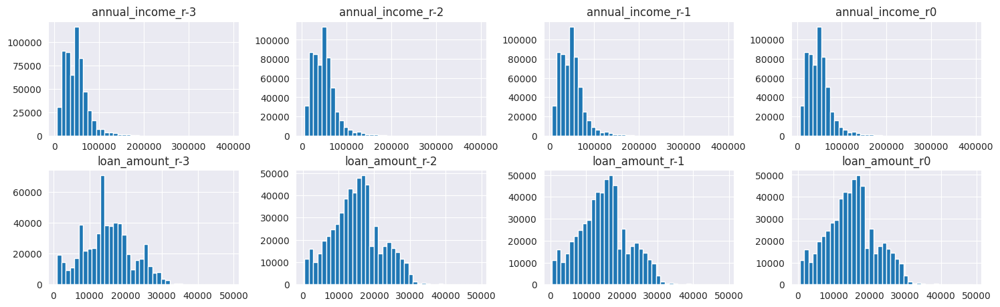

In [16]:
train[ROUND].hist(bins=40, layout=(3, 4), figsize=(18, 8))
plt.show()

In [17]:
BINS = []
# b = 6
# for c in tqdm(['annual_income','loan_amount','credit-X1-dti'], desc='Binning'):
#     n = f"{c}_bin{b}"
#     train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
#     test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
#     test[n].fillna(-1, inplace=True)
#     BINS.append(n)

## -> quantile cuts --
for c in tqdm(['annual_income', 'loan_amount', 'credit-X1-dti'], desc='Binning'):
    for b in [5, 10]:
        n = f"{c}_qbin{b}"
        train[n], edges = pd.qcut(train[c], q=b, duplicates='drop', retbins=True, labels=False)
        test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
        test[n].fillna(-1, inplace=True)
        BINS.append(n)

print(f"Total Binned: {len(BINS)}")

Binning:   0%|          | 0/3 [00:00<?, ?it/s]

Total Binned: 6


In [18]:
# ## -> value-based cuts --
# BINS = []
# for c in tqdm(['loan_amount'], desc='Binning'):
#     b = [0, 5000, 10000, 20000, 30000, 40000, np.inf]
#     n = f"{c}_binned"
#     train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
#     test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
#     test[n].fillna(-1, inplace=True)
#     BINS.append(n)

# for c in tqdm(['annual_income'], desc='Binning'):
#     b = [0, 40000, 75000, 100000, 150000, 250000, 300000, np.inf]
#     n = f"{c}_binned"
#     train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
#     test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
#     test[n].fillna(-1, inplace=True)
#     BINS.append(n)

# for c in tqdm(['credit-X1-dti'], desc='Binning'):
#     for b in [5]:
#         n = f"{c}_binned"
#         train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
#         test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
#         test[n].fillna(-1, inplace=True)
#         BINS.append(n)

# print(f"Total Binned: {len(BINS)}")

# print("Train null:", train.isna().sum().sum())
# print("Test null:", test.isna().sum().sum())

In [19]:
display(train.shape, test.shape)
train.head()

(593994, 33)

(254569, 32)

,annual_income,debt_to_income_ratio,credit_score,loan_amount,interest_rate,gender,marital_status,education_level,employment_status,loan_purpose,grade_subgrade,loan_paid_back,credit-X1-dti,loan-income-ratio,annual_income_r-3,annual_income_r-2,annual_income_r-1,annual_income_r0,loan_amount_r-3,loan_amount_r-2,loan_amount_r-1,loan_amount_r0,debt_to_income_ratio_d1,debt_to_income_ratio_d2,debt_to_income_ratio_d3,interest_rate_d1,interest_rate_d2,annual_income_qbin5,annual_income_qbin10,loan_amount_qbin5,loan_amount_qbin10,credit-X1-dti_qbin5,credit-X1-dti_qbin10
0,29367.99,0.084,736,2528.42,13.67,Female,Single,High School,Self-employed,Other,C3,1.0,674.176,0.086094,29000,29400,29370,29368,3000,2500,2530,2528,0,8,4,6,7,1,2,0,0,4,8
1,22108.02,0.166,636,4593.10,12.92,Male,Married,Master's,Employed,Debt consolidation,D3,0.0,530.424,0.207757,22000,22100,22110,22108,5000,4600,4590,4593,1,6,6,9,2,0,1,0,0,0,1
2,49566.20,0.097,694,17005.15,9.76,Male,Single,High School,Employed,Debt consolidation,C5,1.0,626.682,0.343080,50000,49600,49570,49566,17000,17000,17010,17005,0,9,7,7,6,2,5,3,6,3,6
3,46858.25,0.065,533,4682.48,16.10,Female,Single,High School,Employed,Debt consolidation,F1,1.0,498.355,0.099929,47000,46900,46860,46858,5000,4700,4680,4682,0,6,5,1,0,2,5,0,0,0,0
4,25496.70,0.053,665,12184.43,10.21,Male,Married,High School,Employed,Other,D1,1.0,629.755,0.477883,25000,25500,25500,25497,12000,12200,12180,12184,0,5,3,2,1,1,2,1,3,3,6


# ML TRAINING -|- BASE

In [20]:
X = train.drop([TARGET], axis=1)
y = train[TARGET]

seeding = 9
FOLDS  = 5
kf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=SEED)
kf

StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

In [21]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models0 = {}
logit0  = LogisticRegression(
    max_iter= 1000,
    solver= 'lbfgs',
    C= 0.1,
    tol= 1e-5,
    n_jobs= 3,
    random_state= seeding
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    X_test = test.copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CATS + DIGITS + BINS),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit0,
    )
    model.fit(X_train, y_train)

    y_pred = model.predict_proba(X_val)[:, 1]
    oof_preds[val_idx] = y_pred

    predictions = model.predict_proba(X_test)[:, 1]
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models0[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.5f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

del X_train, X_val, X_test

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/5
	AUC: 0.91577
| --------------------
Fold 2/5
	AUC: 0.91496
| --------------------
Fold 3/5
	AUC: 0.91351
| --------------------
Fold 4/5
	AUC: 0.91466
| --------------------
Fold 5/5
	AUC: 0.91414
--------------------
	Training Time: 4.08 mins


In [22]:
## -- After all folds -- 3839,3952
print(f"|{'-'*52}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models0['model-1'][0].get_feature_names_out(X.columns)
print(f" | Feature Out: {len(features)}")
print(f" | Overall AUC: {overall_AUC:.6f}")
print(f" | Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*52}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

|----------------------------------------------------
 | Feature Out: 145
 | Overall AUC: 0.914604
 | Average AUC: 0.914608 ± 0.000763
|----------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.88      0.60      0.71    119500
         1.0       0.91      0.98      0.94    474494

    accuracy                           0.90    593994
   macro avg       0.89      0.79      0.83    593994
weighted avg       0.90      0.90      0.90    593994



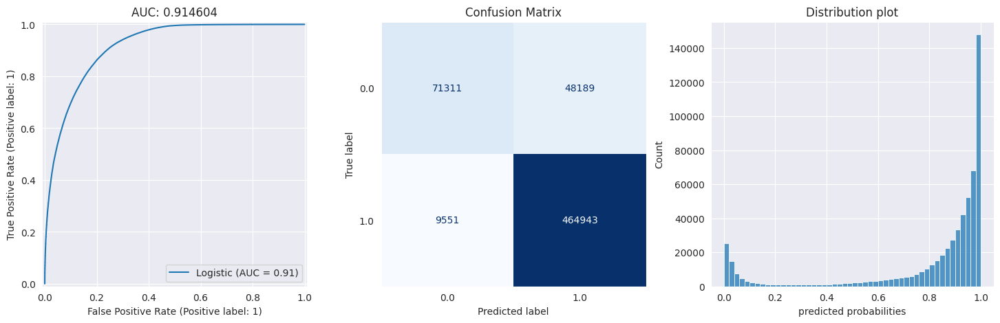

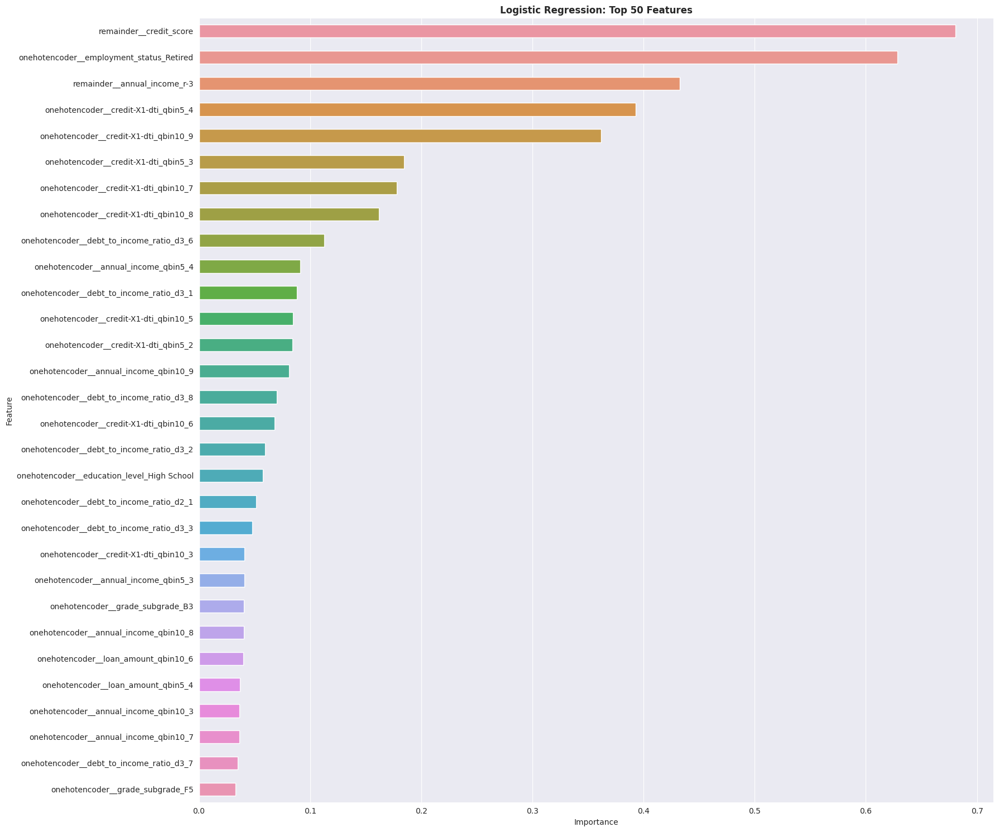

In [23]:
_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))
importances = models0['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)
sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')

plt.tight_layout()
plt.show()

In [24]:
## -- Create Submissions for each model --
s = str(round(overall_AUC, 5)).split('.')[1]
np.save(f"oof_log_BASE_seed{seeding}_{s}.npy", oof_preds)
np.save(f"pred_log_BASE_seed{seeding}_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# # submit[TARGET] = test_preds
# # submit.to_csv(f"submit_logistic_BASE_{s}.csv", index=False)

# # print(f"{COLOR}✅ submit_logistic_BASE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- OHE

In [25]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models1 = {}
logit1 = LogisticRegression(
    max_iter=1000,
    solver='lbfgs',
    C=1e-3,
    tol=1e-5,
    n_jobs=3,
    random_state=seeding,
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    X_test = test.copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CAT_COLS + DIGITS + BINS ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit1,
    )
    model.fit(X_train, y_train)

    y_pred = model.predict_proba(X_val)[:, 1]
    oof_preds[val_idx] = y_pred

    predictions = model.predict_proba(X_test)[:, 1]
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models1[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.5f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

del X_train, X_val, X_test

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/5
	AUC: 0.92413
| --------------------
Fold 2/5
	AUC: 0.92480
| --------------------
Fold 3/5
	AUC: 0.92296
| --------------------
Fold 4/5
	AUC: 0.92413
| --------------------
Fold 5/5
	AUC: 0.92360
--------------------
	Training Time: 1.15 mins


In [26]:
## -- After all folds --
print(f"|{'-'*30}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models1['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*30}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

|------------------------------
| Feature Out: 2495
| Overall AUC: 0.923920
| Average AUC: 0.923923 ± 0.000614
|------------------------------
              precision    recall  f1-score   support

         0.0       0.87      0.64      0.74    119500
         1.0       0.92      0.98      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.89      0.81      0.84    593994
weighted avg       0.91      0.91      0.90    593994



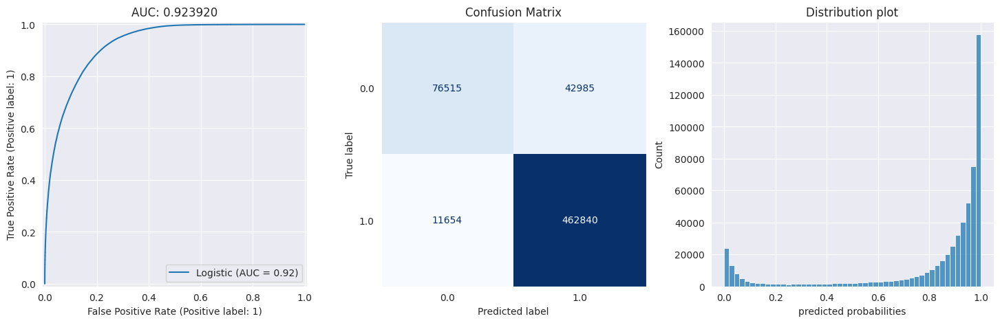

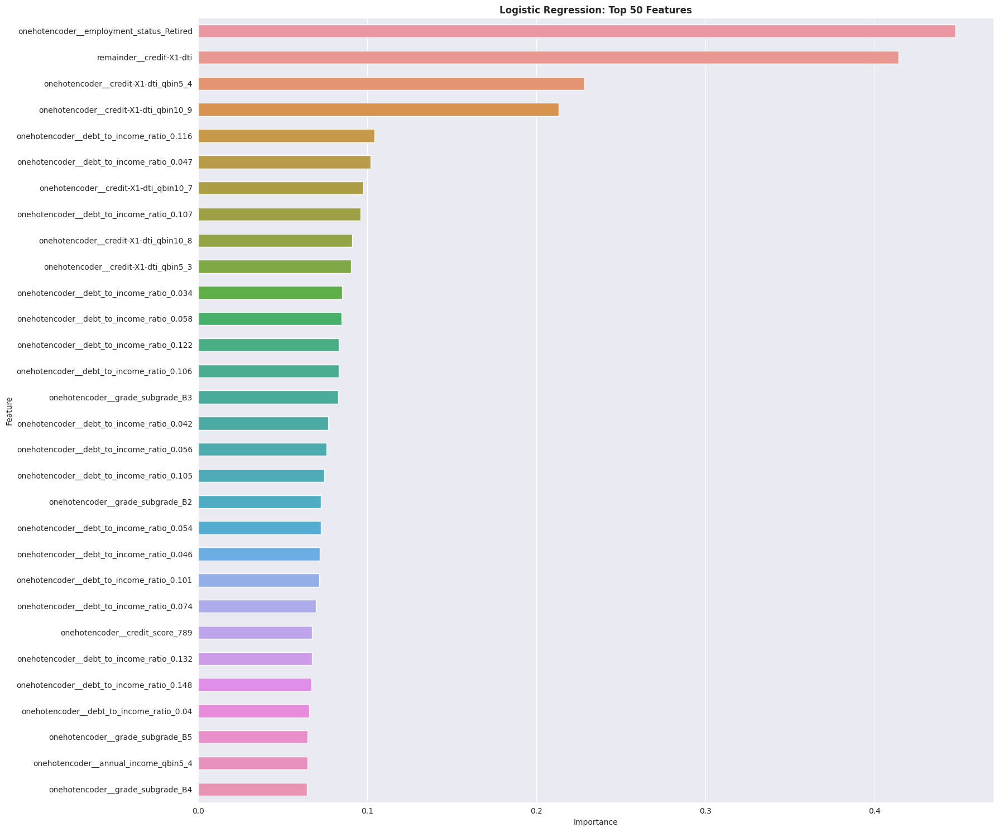

In [27]:
_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))
importances = models1['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)
sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')

plt.tight_layout()
plt.show()

### SUBMISSION

In [28]:
## -- Create Submissions for each model --
s = str(round(overall_AUC, 5)).split('.')[1]
np.save(f"oof_log_OHE_seed{seeding}_{s}.npy", oof_preds)
np.save(f"pred_log_OHE_seed{seeding}_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_OHE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_OHE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- TE

In [29]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models2 = {}
logit2 = LogisticRegression(
    max_iter= 1000,
    solver= 'liblinear',
    C= 1e-3,
    tol= 1e-5,
    n_jobs= 3,
    random_state= seeding,
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    X_test = test.copy()

    ## -- Factorize using combined data --
    for c in CATS:
        combined = pd.concat([X_train[c], X_val[c], X_test[c]], axis=0)
        combined = combined.astype('category')#factorize()[0]
        X_train[c] = combined[:len(X_train)]#.astype("int8")
        X_val[c]  = combined[len(X_train):len(X_train)+len(X_val)]#.astype("int8")
        X_test[c]  = combined[-len(X_test):]#.astype("int8")

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (TargetEncoder(
                target_type='binary',
                random_state=seeding,
                smooth=10.0,
                cv=5,
            ), CAT_COLS + ROUND + BINS + DIGITS ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(),
        logit2,
    )
    model.fit(X_train, y_train)

    y_pred = model.predict_proba(X_val)[:, 1]
    oof_preds[val_idx] = y_pred

    predictions = model.predict_proba(X_test)[:, 1]
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models2[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.5f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

del X_train, X_val, X_test

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/5
	AUC: 0.92341
| --------------------
Fold 2/5
	AUC: 0.92427
| --------------------
Fold 3/5
	AUC: 0.92246
| --------------------
Fold 4/5
	AUC: 0.92363
| --------------------
Fold 5/5
	AUC: 0.92306
--------------------
	Training Time: 0.94 mins


In [30]:
## -- After all folds --
print(f"|{'-'*52}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models2['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*52}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

|----------------------------------------------------
| Feature Out: 32
| Overall AUC: 0.923365
| Average AUC: 0.923366 ± 0.000603
|----------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.85      0.66      0.74    119500
         1.0       0.92      0.97      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.88      0.81      0.84    593994
weighted avg       0.90      0.91      0.90    593994



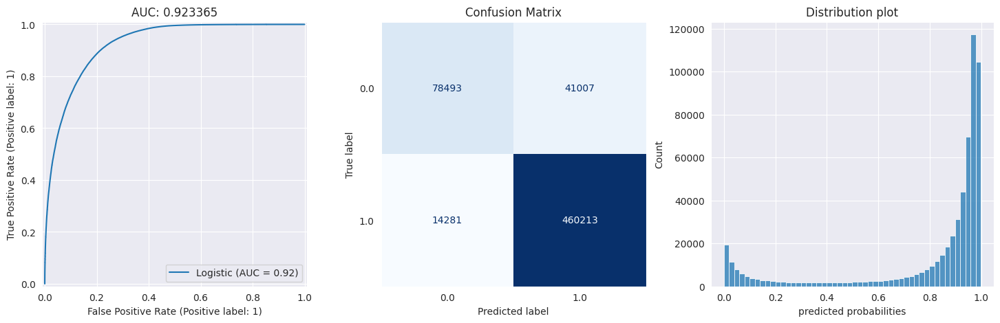

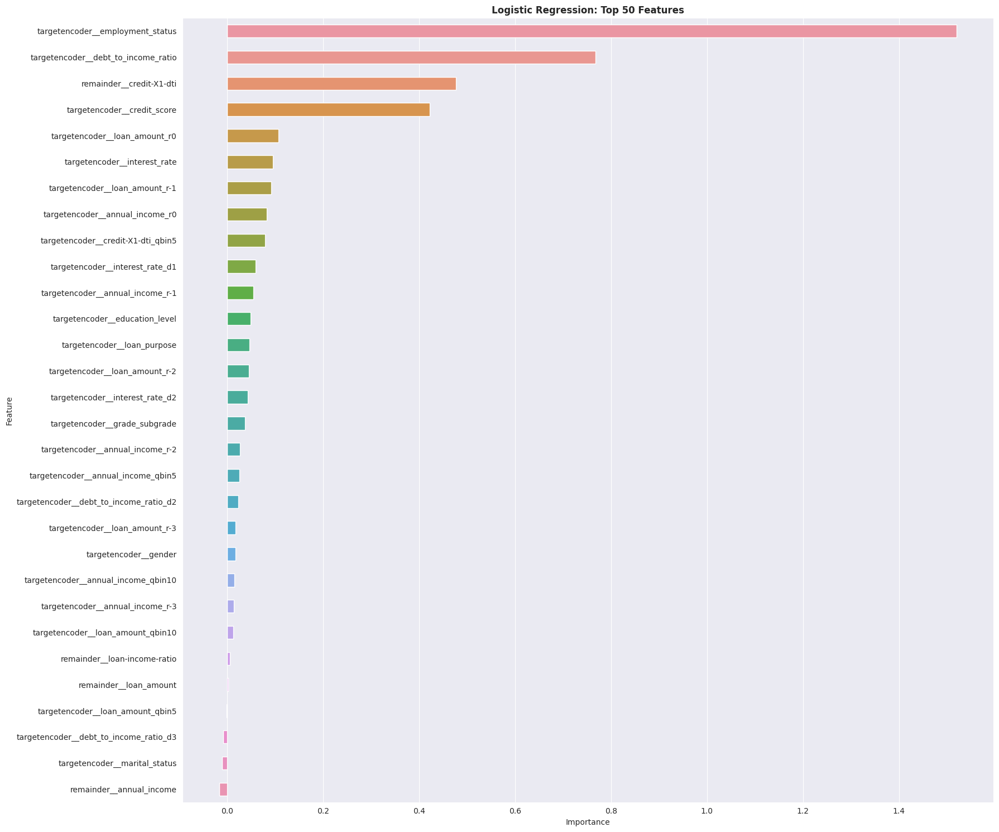

In [31]:
_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))

importances = models2['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)
sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')

plt.tight_layout()
plt.show()

### SUBMISSION

In [32]:
## -- Create Submissions for each model --
s = str(round(overall_AUC, 5)).split('.')[1]
np.save(f"oof_log_TE_seed{seeding}_{s}.npy", oof_preds)
np.save(f"pred_log_TE_seed{seeding}_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_TE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_TE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- TE + OHE

In [33]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models3 = {}
logit3 = LogisticRegression(
    max_iter= 1000,
    solver= 'lbfgs',
    C= 0.01,
    tol= 1e-5,
    n_jobs= 3,
    random_state= seeding,
)
oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    X_test = test.copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CATS + DIGITS + BINS ),
            (TargetEncoder(
                target_type='binary',
                random_state= seeding,
                smooth=10.0,
                cv=5,
            ), ROUND + ['credit_score', 'debt_to_income_ratio', 'interest_rate'] ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit3,
    )
    model.fit(X_train, y_train)

    y_pred = model.predict_proba(X_val)[:, 1]
    oof_preds[val_idx] = y_pred

    predictions = model.predict_proba(X_test)[:, 1]
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models3[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.5f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

del X_train, X_val, X_test

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/5
	AUC: 0.92578
| --------------------
Fold 2/5
	AUC: 0.92628
| --------------------
Fold 3/5
	AUC: 0.92452
| --------------------
Fold 4/5
	AUC: 0.92577
| --------------------
Fold 5/5
	AUC: 0.92499
--------------------
	Training Time: 5.62 mins


In [34]:
## -- After all folds --
print(f"|{'-'*52}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models3['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*52}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

|----------------------------------------------------
| Feature Out: 145
| Overall AUC: 0.925462
| Average AUC: 0.925464 ± 0.000629
|----------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.86      0.65      0.74    119500
         1.0       0.92      0.97      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.89      0.81      0.84    593994
weighted avg       0.91      0.91      0.90    593994



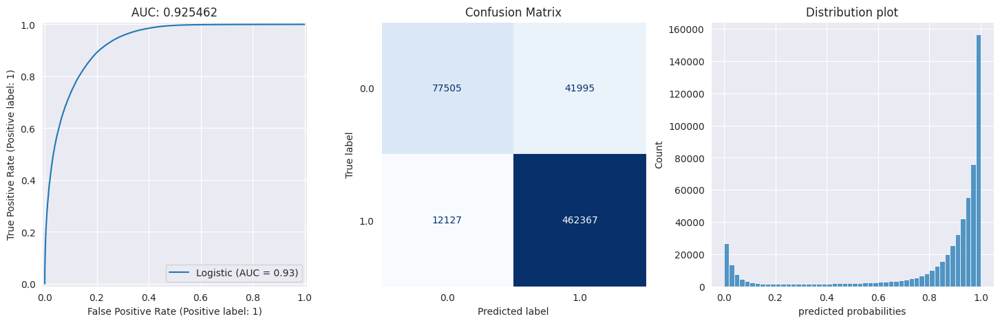

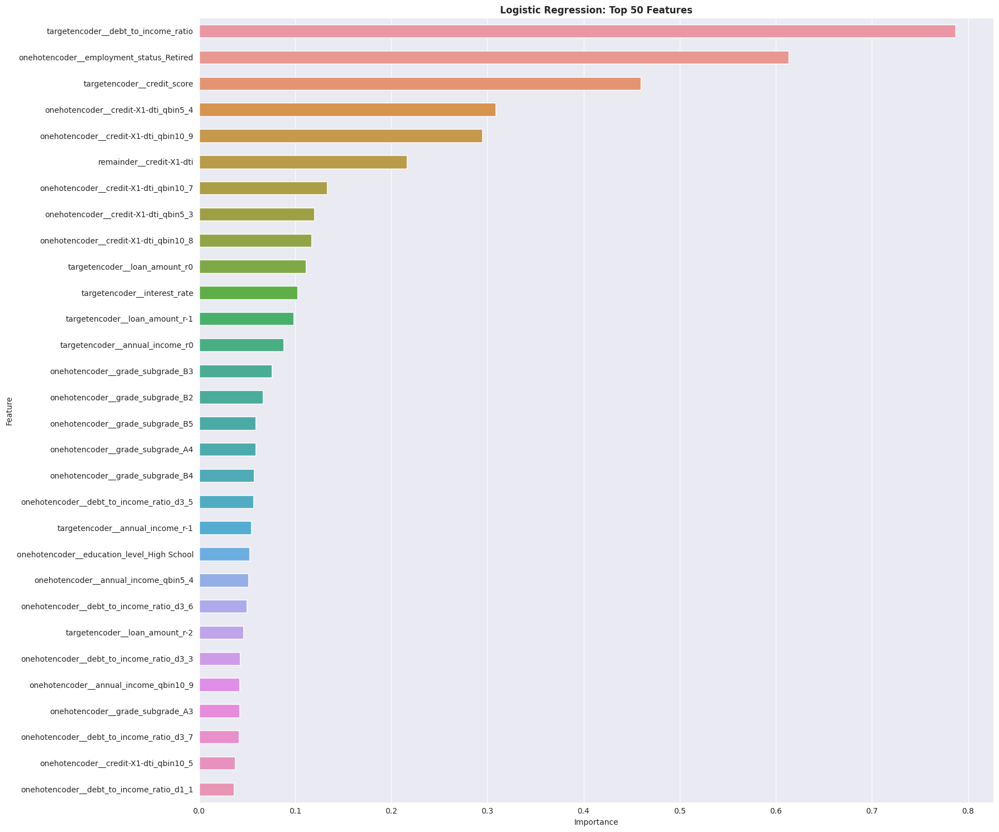

In [35]:
_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))

importances = models3['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)

sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')
plt.tight_layout()
plt.show()

### SUBMISSION

In [36]:
## -- Create Submissions for each model --
s = str(round(overall_AUC, 5)).split('.')[1]
np.save(f"oof_log_TEOHE_seed{seeding}_{s}.npy", oof_preds)
np.save(f"pred_log_TEOHE_seed{seeding}_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_TE+OHE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_TE+OHE_{s}.csv file saved!")

✅ oof & prediction files saved!


# HILLCLIMB

In [37]:
oof_df = pd.DataFrame()
pred_df = pd.DataFrame()
print("Loading data: ", end="")
for (root, dirs, files) in os.walk("/kaggle/working"):
    for i, file in enumerate(sorted(files), 1):
        if i%20 == 0: print(f"{i}%.. ", end="")
        if file.endswith(".npy") and "oof" in file:
            oof_df = pd.concat([oof_df, pd.Series(np.load(os.path.join(root, file)), name=file[4:-4])], axis=1)
        elif file.endswith(".npy") and "pred" in file:
            pred_df = pd.concat([pred_df, pd.Series(np.load(os.path.join(root, file)), name=file[5:-4])], axis=1)

print(COLOR)
print(f"Total oof models : {len(oof_df.columns)}")
print(f"Total pred models: {len(pred_df.columns)}")
display(oof_df.head())
display(pred_df.head())

Loading data: 
Total oof models : 4
Total pred models: 4


,log_BASE_seed9_9146,log_OHE_seed9_92392,log_TEOHE_seed9_92546,log_TE_seed9_92336
0,0.981829,0.978079,0.985013,0.974821
1,0.755801,0.419866,0.551368,0.580430
2,0.960958,0.951472,0.965921,0.966326
3,0.793624,0.872586,0.852675,0.804695
4,0.975461,0.983131,0.983140,0.978106


,log_BASE_seed9_9146,log_OHE_seed9_92392,log_TEOHE_seed9_92546,log_TE_seed9_92336
0,0.940900,0.948233,0.937167,0.939575
1,0.986168,0.983401,0.987183,0.971118
2,0.311811,0.521233,0.391692,0.337362
3,0.920575,0.820567,0.927805,0.942753
4,0.971002,0.959118,0.975959,0.975513


In [38]:
%%time
pred_hc, oof_hc = climb_hill(
                               train = trn,
                              target = TARGET,
                         oof_pred_df = oof_df,
                        test_pred_df = pred_df,
                           objective = "maximize",
                         eval_metric = partial(roc_auc_score),
                    # negative_weights = True,
                    return_oof_preds = True,
                           precision = 0.001,
                           plot_hill = True,
                           plot_hist = True,
    )

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (4 total): 

log_TEOHE_seed9_92546: 0.92546 (best solo model)
log_OHE_seed9_92392:   0.92392
log_TE_seed9_92336:    0.92336
log_BASE_seed9_9146:   0.91460

[Data preparation completed successfully] - [Initiate hill climbing] 

Iteration: 1 | Model added: log_OHE_seed9_92392 | Best weight: 0.356 | Best roc_auc_score: 0.92604
Iteration: 2 | Model added: log_TE_seed9_92336 | Best weight: 0.001 | Best roc_auc_score: 0.92604


CPU times: user 12min 29s, sys: 1.85 s, total: 12min 30s
Wall time: 11min 16s


In [39]:
submit[TARGET] = pred_hc
submit.to_csv(f"submit_HC_logit-4-models_seed{seeding}.csv", index=False)
print(f"✅ Saved hillclimb predictions!!!")
submit.head()

✅ Saved hillclimb predictions!!!


,id,loan_paid_back
0,593994,0.941105
1,593995,0.985822
2,593996,0.437708
3,593997,0.889681
4,593998,0.969969


In [40]:
np.save(f"oof_log-ensemble_seed{seeding}.npy", oof_hc)
np.save(f"pred_log-ensemble_seed{seeding}.npy", pred_hc)

In [41]:
len(oof_hc), len(pred_hc)

(593994, 254569)